# **DETR Comparative Study**

This code block clones the repository, and installs some requirements enabling us to visualize and analyze the results obtained from the experiment.

In [ ]:
!git clone https://github.com/jeremyreist/DETR-Comparative-Study.git
!pip install pandas matplotlib seaborn

Cloning into 'DETR-Comparative-Study'...
remote: Enumerating objects: 606, done.
remote: Counting objects: 100% (187/187), done.
remote: Compressing objects: 100% (102/102), done.
remote: Total 606 (delta 71), reused 180 (delta 69), pack-reused 419
Receiving objects: 100% (606/606), 425.93 MiB | 32.11 MiB/s, done.
Resolving deltas: 100% (91/91), done.
Updating files: 100% (73/73), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


**Video Results by Model**

The following code compresses and displays all videos in the results directory of the DETR-Comparative-Study repository. It will take **~1 min** to run, depending on the number and length of videos in the directory. The compressed videos have lower quality than the original videos due to the compression process. This is neccessary due to limitations from Google Colab

In [ ]:
import os
from IPython.display import display, HTML
from base64 import b64encode

# Results directory path
compressed_dir = "./DETR-Comparative-Study/results/compressed"

# Loop through all files in the compressed directory
for file in os.listdir(compressed_dir):
    # Check if the file is an mp4 video
    if file.endswith(".mp4"):
        # Get the video title
        video_title = os.path.splitext(file)[0]
        # Get the video path
        video_path = os.path.join(compressed_dir, file)
        
        # Read the compressed video as bytes and encode it using base64
        mp4 = open(video_path, 'rb').read()
        data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
        
        # Show video with title
        display(HTML(f"<h3>{video_title}</h3><video width=650 controls><source src='{data_url}' type='video/mp4'></video>"))


# **MIoU Calculations**
Here is the function we are using to calculate the MIoU of the different models

In [ ]:
import numpy as np

def calculateMIoU(predictions:list, gt_boxes: dict):
    """ Calculates the Mean Intersection over Union (IoU) between the predicted bounding boxes and the ground truth bounding boxes.

    Args:
        predictions (list): A list of NumPy arrays, where each array contains the predicted bounding boxes for a frame.
            e.g. predictions = [array([[x1, y1, x2, y2], [x1, y1, x2, y2], ...]), array([[x1, y1, x2, y2], ...]), ...]

        gt_boxes (dict): A dictionary containing the ground truth bounding boxes for each frame.
            e.g. gt_boxes = {1: [[x1, y1, x2, y2], [x1, y1, x2, y2], ...], 2: [[x1, y1, x2, y2], ...], ...}

    Returns:
        float: The mean IoU for the current ground truth set.
    """
    ious = []
    # Convert gt_boxes to a NumPy array
    gt_boxes = {k: np.array(v) for k, v in gt_boxes.items()}

    for i in range(len(predictions)):
        # Convert the current frame's predictions to a NumPy array
        preds = np.array(predictions[i])

        if i+1 in gt_boxes.keys():
            for gt in gt_boxes[i+1]:
                if preds.size > 0:
                    # Calculate the intersection area
                    xA = np.maximum(preds[:, 0], gt[0])
                    yA = np.maximum(preds[:, 1], gt[1])
                    xB = np.minimum(preds[:, 2], gt[2])
                    yB = np.minimum(preds[:, 3], gt[3])
                    intersection_area = np.maximum(0, xB - xA + 1) * np.maximum(0, yB - yA + 1)

                    # Calculate the union area
                    box1_area = (preds[:, 2] - preds[:, 0] + 1) * (preds[:, 3] - preds[:, 1] + 1)
                    box2_area = (gt[2] - gt[0] + 1) * (gt[3] - gt[1] + 1)
                    union_area = box1_area + box2_area - intersection_area

                    # Calculate the IoUs
                    ious_frame = intersection_area / union_area

                    # Find the maximum IoU
                    max_iou = np.max(ious_frame)

                else:
                    max_iou = 0

                ious.append(max_iou)

    # Calculate the mean IoU for the current ground truth set
    mean_iou = np.mean(ious)

    return mean_iou

**MOT20 Model Evaluation**

The function reads ground truth bounding boxes from a text file, then iterates through all the pickle files in the results directory corresponding to the specific video and model type. It loads the predicted bounding boxes from the pickle files, calculates the Mean Intersection over Union (MIoU) between the predicted and ground truth bounding boxes, and prints the MIoU values for each file.

In [ ]:
import os, pickle

results_dir = "DETR-Comparative-Study/results"

def process_mot20(video_name, model_type):
    det_txt = os.path.join(results_dir, f"det-{video_name}/det.txt")

    # Load ground truth bounding boxes from the det.txt file
    gt_boxes = {}
    with open(det_txt, "r") as f:
        for line in f:
            frame_id, _, x, y, w, h, _, _, _, _ = map(float, line.strip().split(","))
            frame_id = int(frame_id)
            if frame_id not in gt_boxes:
                gt_boxes[frame_id] = []
            gt_boxes[frame_id].append([x, y, x + w, y + h])

    # Iterate through all models in the directory
    for file_name in os.listdir(results_dir):
        # Check if the file is a pickle file
        if f"MOT20-{video_name}-{model_type}.pkl" == file_name:
            pickle_path = os.path.join(results_dir, file_name)
            with open(pickle_path, 'rb') as pickle_file:
                detr_preds = pickle.load(pickle_file)
                # In the case of trackformer which has already calculated the MIoU scores
                if type(detr_preds) != list:
                  total_score = 0
                  count = 0
                  for key in detr_preds:
                      for inner_key in detr_preds[key]:
                          total_score += detr_preds[key][inner_key]['score']
                          count += 1
                  miou = total_score / count
                else:
                  miou = calculateMIoU(detr_preds, gt_boxes)
                # print(f"MIoU for {file_name.rstrip('.pkl')}: {miou}")
                return miou


# process_mot20("MOT20-07", "detr")
# process_mot20("MOT20-07", "deformable-detr")
# process_mot20("MOT20-07", "trackformer")


# **YouTube Objects v2.2 Evaluation**



In [ ]:
import os, pickle
from scipy.io import loadmat

results_dir = "DETR-Comparative-Study/results"

# Processes a sequence of frames using either the DETR object detection model or a baseline method and calculates the Mean IoU for the ground truth.
def process_yt_obj(number_of_frames, model_type):

    # Load ground truth bounding boxes from .mat files
    gt_boxes_1 = loadmat(f'{results_dir}/gt_yt_obj_car/bb_gtTest_car.mat')['bb_gtTest'][0]
    gt_boxes_2 = loadmat(f'{results_dir}/gt_yt_obj_car/bb_gtTraining_car.mat')['bb_gtTraining'][0]
    
    # Combine ground truth bounding boxes into a single dictionary
    gt_boxes = {}
    for i in gt_boxes_1:
        gt_boxes[i[0][0]] = i[1][0]
    for i in gt_boxes_2:
        gt_boxes[i[0][0]] = i[1][0]

    gt_boxes = {int(key[3:]): [value] for key, value in gt_boxes.items()}

    # Iterate through all models in the directory
    for file_name in os.listdir(results_dir):
        # Check if the file is a pickle file
        if f"YT-Obj-2.2-{number_of_frames}-{model_type}.pkl" == file_name:
            pickle_path = os.path.join(results_dir, file_name)
            with open(pickle_path, 'rb') as pickle_file:
                detr_preds = pickle.load(pickle_file)
                miou = calculateMIoU(detr_preds, gt_boxes)
                # print(f"MIoU for {file_name.rstrip('.pkl')}: {miou}")
                return miou

# process_yt_obj(500, 'deformable-detr')
# process_yt_obj(500, 'detr')

# **Visualizing Analytical Results**

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, HTML

def plot_bar_graph_and_table(df, title):
    # Generate the bar graph
    plt.figure(figsize=(7, 4))
    sns.barplot(x='Model Name', y='MIoU', data=df, palette='mako')
    plt.title(title)
    plt.xlabel('Model Name'), 
    plt.ylabel('MIoU')
    plt.show()

    # Generate the table
    display(HTML(df.to_html(index=False, classes=['table', 'table-bordered', 'table-striped'])))

In [ ]:
#@title
%%html
<style>
    .table {
        font-family: Arial, sans-serif;
        border-collapse: collapse;
        width: 50%;
        margin-left: auto;
        margin-right: auto;
    }
    .table-bordered, .table-bordered th, .table-bordered td {
        border: 1px solid #ddd;
        padding: 8px;
    }
    .table-striped tbody tr:nth-of-type(odd) {
        background-color: #f2f2f2;
    }
    .table th {
        padding-top: 12px;
        padding-bottom: 12px;
        text-align: left;
        background-color: #4CAF50;
        color: white;
    }
</style>

**MOT20 Results**

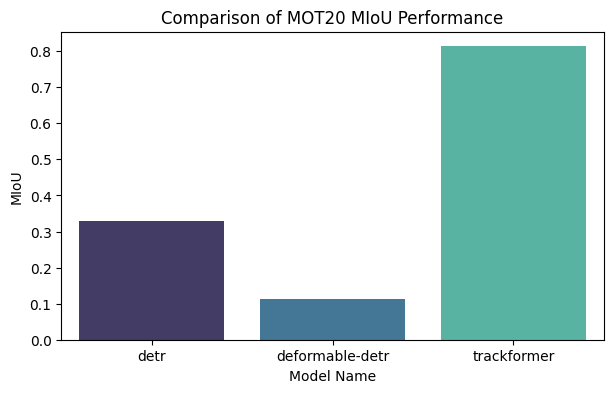

Model Name,MIoU
detr,0.329127
deformable-detr,0.112819
trackformer,0.813151


In [ ]:
name_float_pairs = [('detr', process_mot20("MOT20-07", "detr")), ('deformable-detr', process_mot20("MOT20-07", "deformable-detr")), ('trackformer', process_mot20("MOT20-07", "trackformer"))]
df = pd.DataFrame(name_float_pairs, columns=['Model Name', 'MIoU'])
plot_bar_graph_and_table(df, 'Comparison of MOT20 MIoU Performance')

**YouTube Objects Results**

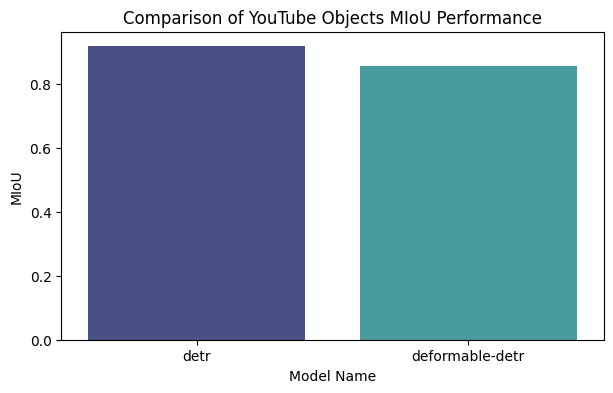

Model Name,MIoU
detr,0.916971
deformable-detr,0.856639


In [ ]:
name_float_pairs = [('detr', process_yt_obj(500, 'detr')), ('deformable-detr', process_yt_obj(500, 'deformable-detr'))]
df = pd.DataFrame(name_float_pairs, columns=['Model Name', 'MIoU'])
plot_bar_graph_and_table(df, 'Comparison of YouTube Objects MIoU Performance')